In [1]:
import cv2 as cv
import os
import sys
from model import preprocess
from model import postprocess
#path = os.path.dirname(os.path.abspath(__file__))
from PIL import Image


sys.path.append('../acllite')

from acllite_model import AclLiteModel
from acllite_resource import AclLiteResource
from constants import IMG_EXT


In [2]:
INPUT_DIR = './data/'
OUTPUT_DIR = './out/'

In [3]:
device_id = 5
model_path = './model/deeplabv3plus513.om'

In [4]:
acl_resource = AclLiteResource(device_id)
acl_resource.init()
print('[Device] NPU Device id:',acl_resource.device_id)
model = AclLiteModel(model_path)

init resource stage:
Init resource success
[Device] NPU Device id: 5
Init model resource start...
[AclLiteModel] create model output dataset:
malloc output 0, size 11053098
Create model output dataset success
Init model resource success


In [5]:
images_list = [os.path.join(INPUT_DIR, img)
                   for img in os.listdir(INPUT_DIR)
                   if os.path.splitext(img)[1] in IMG_EXT]
print(images_list)

['./data/test.jpg']


In [6]:
input_data = preprocess(images_list[0],model._model_desc)

model input size 1
input  0
model input dims ({'name': 'actual_input_1', 'dimCount': 4, 'dims': [1, 3, 513, 513]}, 0)
model input datatype 0
model output size 1
output  0
model output dims ({'name': 'PartitionedCall_Resize_429_ResizeBilinearV2_28:0:output1', 'dimCount': 4, 'dims': [1, 21, 513, 513]}, 0)
model output datatype 1
[Model] class Model init resource stage success
in preprocess, use time:0.24235963821411133


In [7]:
result_list = model.execute([input_data,])

In [8]:
fig = postprocess(result_list, images_list[0], OUTPUT_DIR)

./mask/pic7.jpg dilate_mask_pic
./mask/pic15.jpg dilate_mask_pic
Image saved out path.
in postprocess, use time:2.1872141361236572


In [9]:
images_list = [os.path.join(OUTPUT_DIR, img)
                   for img in os.listdir(OUTPUT_DIR)
                   if os.path.splitext(img)[1] in IMG_EXT]
print(images_list)
output_img = cv.imread(images_list[0])
res_img = cv.cvtColor(output_img, cv.COLOR_BGR2RGB)
res_img_plw = Image.fromarray(res_img)



['./out/test.jpg']


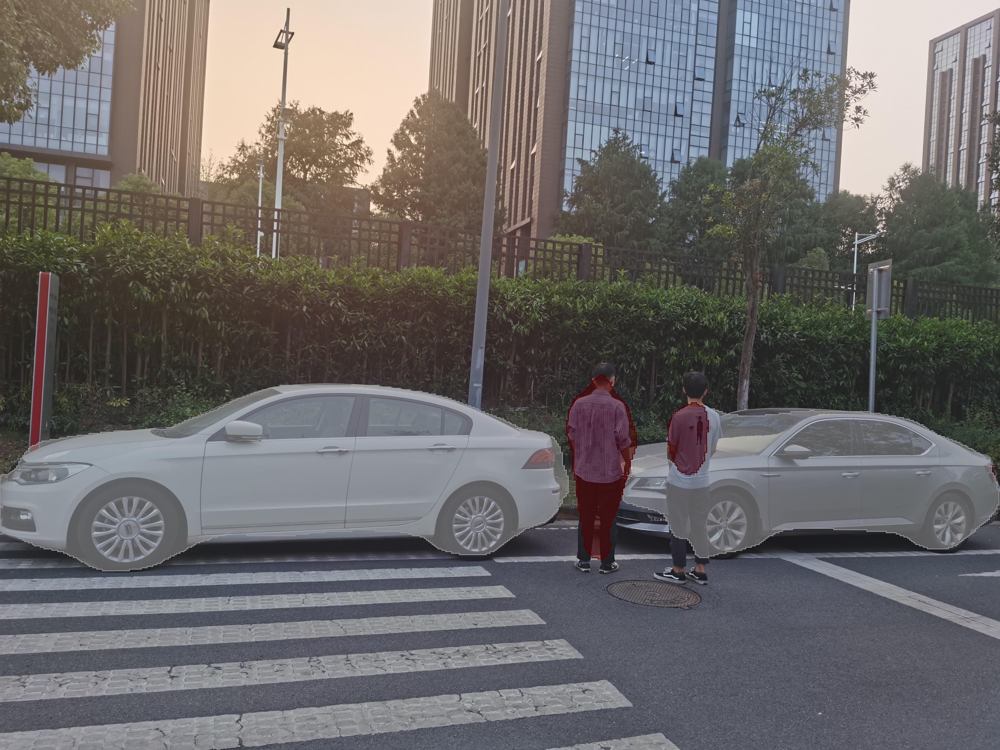

In [10]:
res_img_plw